In [1]:
print("Run 2020-07-090 EfficientNet b5 on full images and respectivly reduced batch size without freezing, 200 cycles. imagenet norm")
runPrefix='alexEfficientNetB5FullImgNormImageNetOneCycle20'
from fastai import *
from fastai.vision import *
from datetime import datetime
from efficientnet_pytorch import EfficientNet
import torch
import sys
import os
print("CUDA device count: " + str(torch.cuda.device_count()))
#torch.cuda.set_device(1)
print("Selected CUDA device: " + str(torch.cuda.current_device()))
print(torch.cuda.get_device_name(0))
FOLD = sys.argv[1]
FOLD = 1 # for test on one fold
path = '/work/projects/hcs_ai/abottemanne/thesis/images/RGB_1_5262020/folds/fold_618_2/fold' + str(FOLD) + '/'
outputDir = path + 'models_alex/' + runPrefix + '/'
print("Output dir: ", outputDir)
try:
    os.makedirs(outputDir)
except Exception:
    pass

tfms = get_transforms(flip_vert=True, max_rotate=45) # add lighting transforms!
print('Setting up ImageDataBunch...')
#EfficientNet.get_image_size(modelName)
data = ImageDataBunch.from_folder(path, bs = 16, resize_method=ResizeMethod.SQUISH, size=456, train = 'train', valid='val', ds_tfms = tfms)

Run 2020-07-090 EfficientNet b5 on full images and respectivly reduced batch size without freezing, 200 cycles. imagenet norm
CUDA device count: 1
Selected CUDA device: 0
Tesla V100-SXM2-32GB
Output dir:  /work/projects/hcs_ai/abottemanne/thesis/images/RGB_1_5262020/folds/fold_618_2/fold1/models_alex/alexEfficientNetB5FullImgNormImageNetOneCycle20/
Setting up ImageDataBunch...


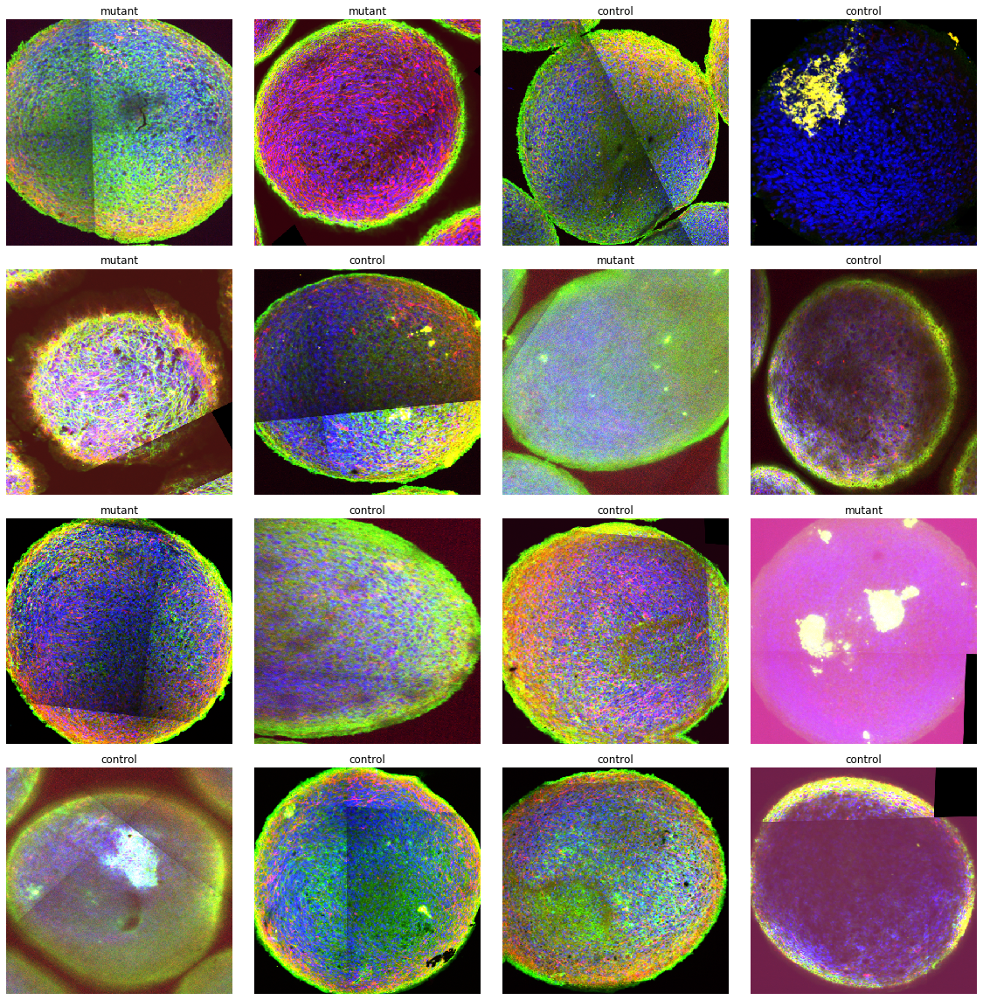

In [2]:
data.show_batch()

In [3]:
#data.normalize(imagenet_stats) # TODO make sure to normalize accordingly at inference!
data.normalize(); # TODO compare which nrom is better

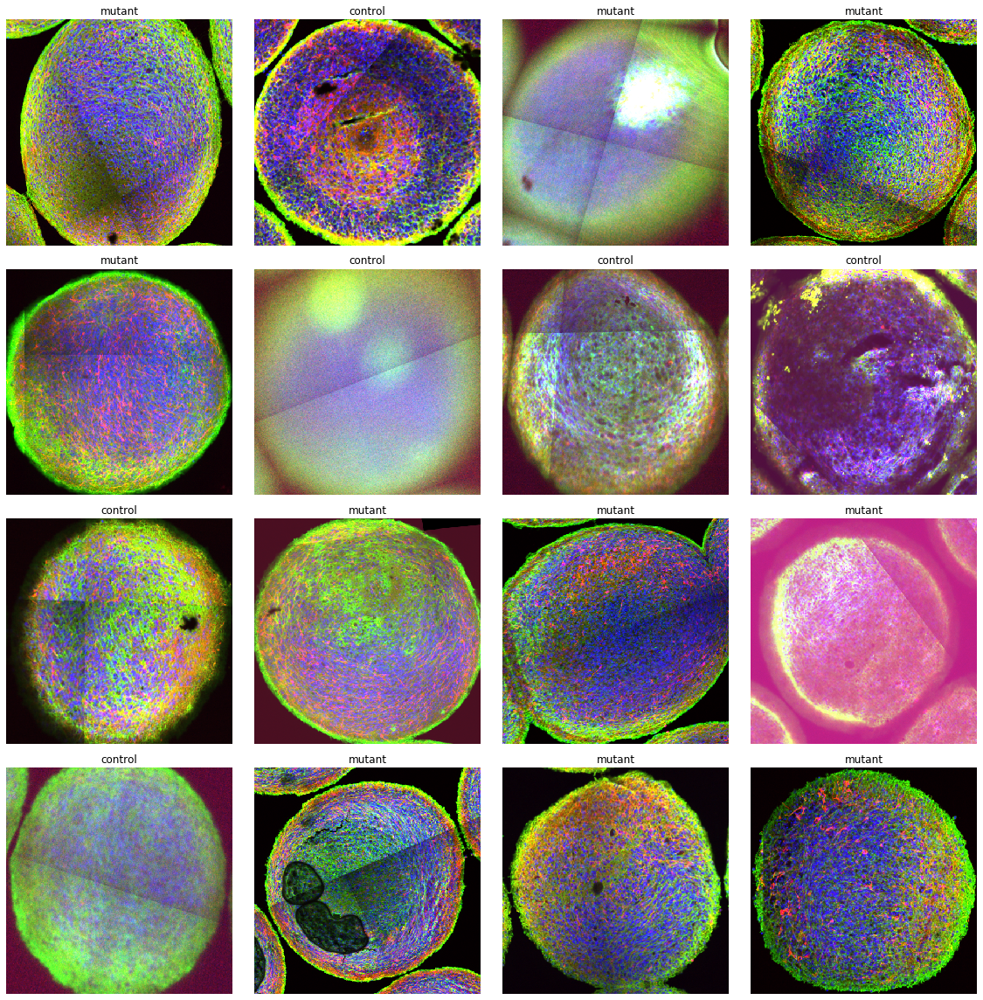

In [4]:
data.show_batch(); # TODO compare which nrom is better

In [5]:
model = EfficientNet.from_pretrained('efficientnet-b5', num_classes=data.c)
learn = Learner(data, model, metrics = [accuracy])
learn.model_dir = outputDir

Loaded pretrained weights for efficientnet-b5


Unfreeze...
LR find...


epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 2.09E-04
Continue trainig...


epoch,train_loss,valid_loss,accuracy,time
0,0.478503,0.375578,0.740741,09:17
1,0.421096,1.383034,0.703704,03:37
2,0.501325,2.915987,0.592593,03:27
3,0.521536,4.902522,0.629630,03:27
4,0.475451,1.169113,0.666667,03:27
5,0.455596,3.098853,0.629630,03:43
6,0.436478,0.475265,0.777778,03:38
7,0.403572,0.452641,0.814815,03:32
8,0.371758,0.470203,0.777778,03:35
9,0.346554,0.362776,0.851852,03:38


Better model found at epoch 0 with accuracy value: 0.7407407164573669.
Better model found at epoch 6 with accuracy value: 0.7777777910232544.
Better model found at epoch 7 with accuracy value: 0.8148148059844971.
Better model found at epoch 9 with accuracy value: 0.8518518805503845.
Better model found at epoch 10 with accuracy value: 0.8888888955116272.
Better model found at epoch 16 with accuracy value: 0.9629629850387573.
ClassificationInterpretation with TTA


[[12  1]
 [ 0 14]]


The validation accuracy is 96.29629516601562 %.


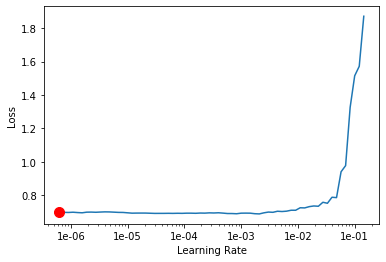

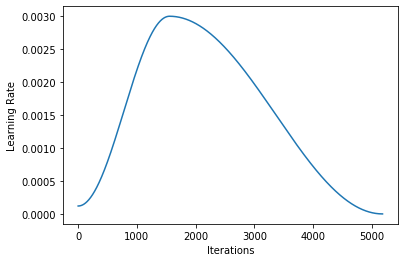

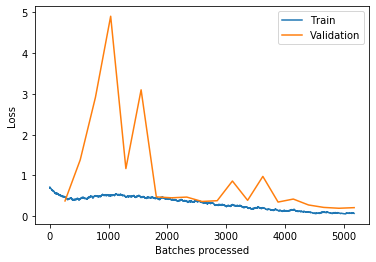

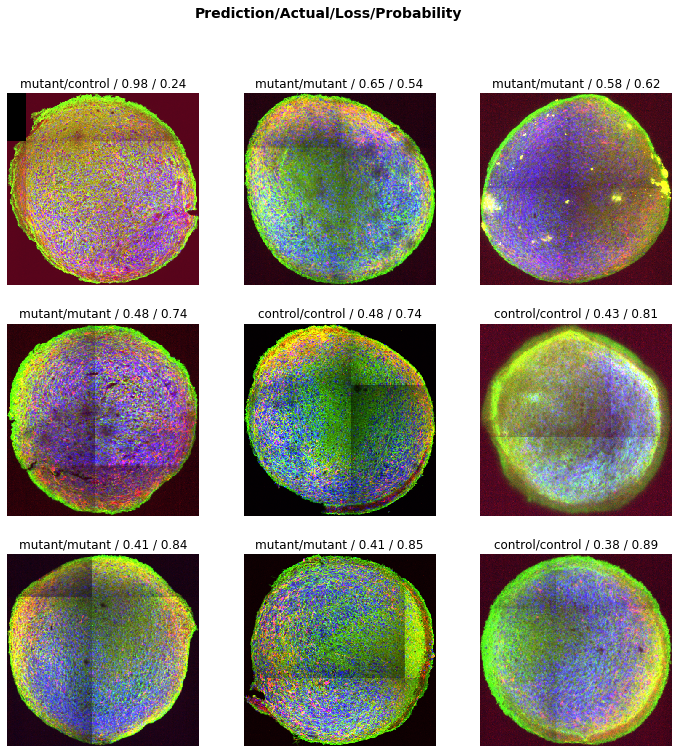

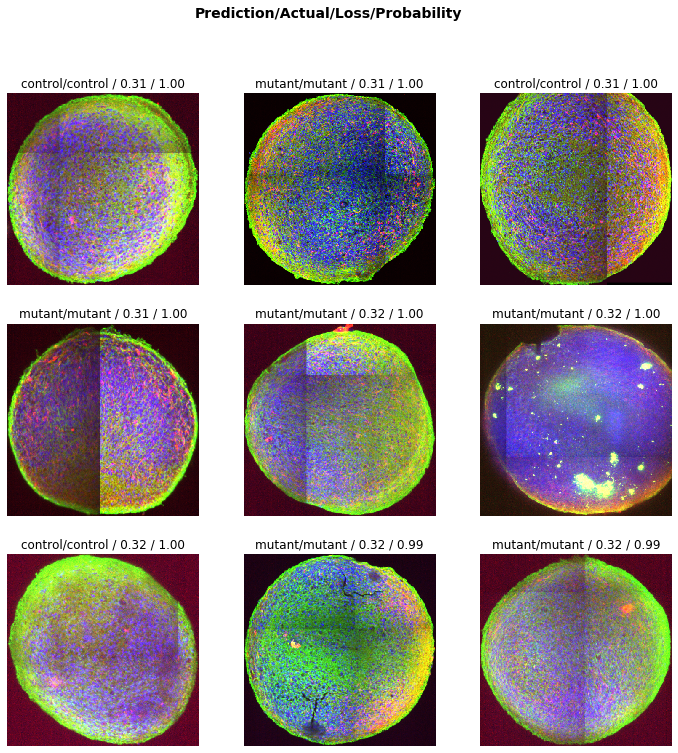

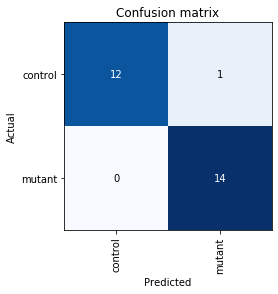

In [6]:
print('Unfreeze...')
#learn.unfreeze()
print('LR find...')
learn.lr_find()
fig = learn.recorder.plot(suggestion=True,return_fig=True)
fig.savefig(outputDir + runPrefix + 'lrfind_unfrozen.png')
suggested_lr = learn.recorder.min_grad_lr
print('Continue trainig...')
# train using fit one cycle policy, autosave the model with the best validation accuracy, overwirte it when there is a
# n improvement (i.e. keep the single best)
myCbs=[callbacks.SaveModelCallback(learn, every='improvement', monitor='accuracy', name = runPrefix + 'BestModel')]
learn.fit_one_cycle(20,callbacks=myCbs) #,suggested_lr)
fig = learn.recorder.plot_lr(return_fig=True) #plot plots LR vs loss
fig.savefig(outputDir + runPrefix + 'train_lr_unfrozen.png')
fig = learn.recorder.plot_losses(return_fig=True)
fig.savefig(outputDir + runPrefix + 'train_losses_unfrozen.png')
## vs learn.fit
#learn.fit_one_cycle(20,max_lr = slice(1e-6,3e-4))
learn.save(outputDir + runPrefix + "LastModel" )
learn.export(outputDir + runPrefix + "LastModelExport")
print('ClassificationInterpretation with TTA')
interp = ClassificationInterpretation.from_learner(learn, tta=True)
print(str(interp.confusion_matrix()))
pFlop9 = interp.plot_top_losses(9,return_fig=True)
#pFlop9Heatmap = interp.plot_top_losses(9,heatmap=True,return_fig=True)
pTop9 = interp.plot_top_losses(9,return_fig=True, largest=False)
#pTop9Heatmap = interp.plot_top_losses(9,heatmap=True,return_fig=True, largest=False)
pConfMat = interp.plot_confusion_matrix(return_fig=True)
pTop9.savefig(outputDir + runPrefix + 'top9.png')
#pTop9Heatmap.savefig(path + 'top9heatmap.png')
pFlop9.savefig(outputDir + runPrefix + 'flop9.png')
#pFlop9Heatmap.savefig(path + 'flop9heatmap.png')
pConfMat.savefig(outputDir + runPrefix + 'confmat.png')
preds,y = learn.TTA() # TTA should apply specified crop transforms (but not crop_pad!) so it should be okay
acc = accuracy(preds, y)
print('The validation accuracy is {} %.'.format(acc * 100))